In [11]:
import pathlib

import pandas as pd
import numpy as np

import nibabel as nib            # reading .mnc files    
import matplotlib.pyplot as plt

import imageio          # for creating gifs

import base64                      
from IPython.display import HTML  # for viewing gifs

from sklearn.cluster import KMeans        # KMean algo

# Data prepare

In [2]:
# read data from file
# https://brainweb.bic.mni.mcgill.ca/
img = nib.load('t1_icbm_normal_1mm_pn3_rf20.mnc')
data = img.get_fdata()

In [3]:
data.shape

(181, 217, 181)

In [4]:
xsize = data.shape[0]
ysize = data.shape[1]
zsize = data.shape[2]

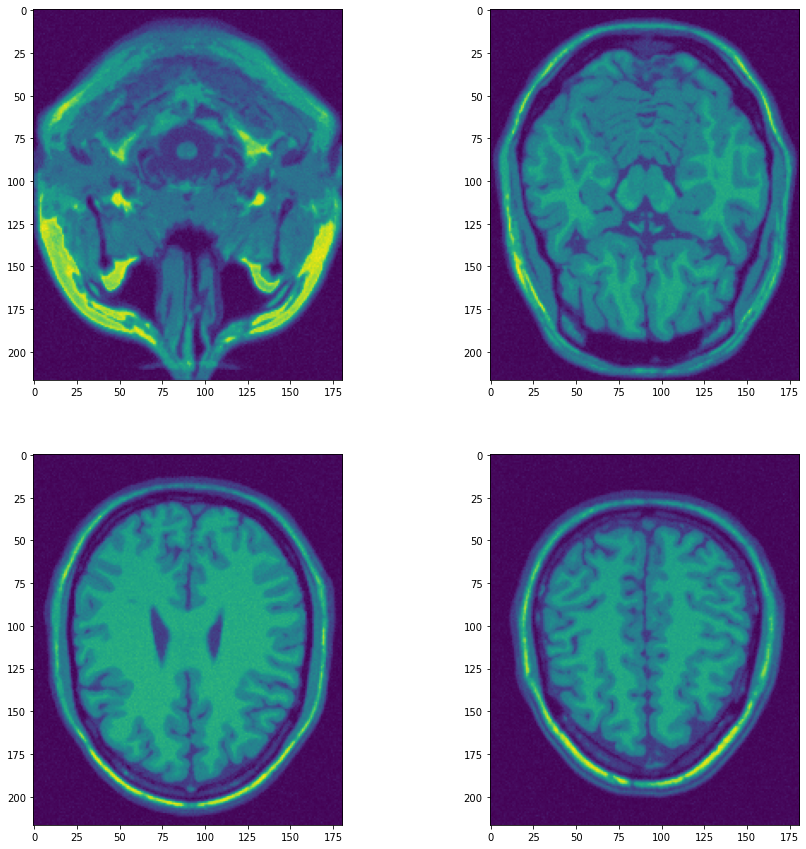

In [5]:
# let's watch some examples of slices
f, axarr = plt.subplots(2,2, figsize=(15,15))
axarr[0,0].imshow(data[0])
axarr[0,1].imshow(data[55])
axarr[1,0].imshow(data[100])
axarr[1,1].imshow(data[120])
plt.show()

In [23]:
# save images in folder and create gif 
Path.mkdir('data/', exist_ok=True)
for i in range(data.shape[0]):
    plt.imsave(f'{i}.png', data[i])
    
with imageio.get_writer('data/mygif.gif', mode='I') as writer:
    for i in range(data.shape[0]):
        image = imageio.imread(f'data/{i}.png')
        writer.append_data(image)
        



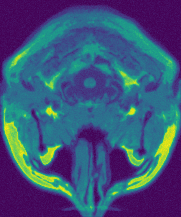

In [27]:
# watch created gif
b64 = base64.b64encode(open('data/mygif.gif','rb').read()).decode('ascii')
display(HTML(f'<img src="data:image/gif;base64,{b64}" />'))

## Searching number of clusters optimum

Разбиение на 2 кластеров готово
Разбиение на 3 кластеров готово
Разбиение на 4 кластеров готово
Разбиение на 5 кластеров готово
Разбиение на 6 кластеров готово
Разбиение на 7 кластеров готово
Разбиение на 8 кластеров готово
Разбиение на 9 кластеров готово
Разбиение на 10 кластеров готово
Разбиение на 11 кластеров готово


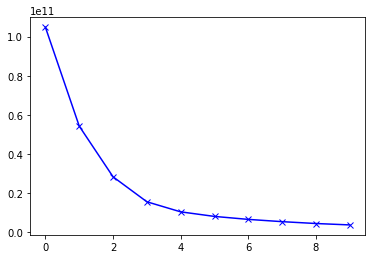

In [105]:
# let define optimal number of clusters
cost = []
for i in range(2,12):
    kmean = kmeans = KMeans(n_clusters=i).fit(data.reshape((-1,1)))
    cost.append(kmean.inertia_)
    print("Разбиение на ", i, " кластеров готово", sep="")

plt.plot(cost, 'bx-')

As we can see critical numbers of clusters are 4, 6 and 8. Due to expert knowledges in medical sphere we can define number of clusters as 6

## KMean Fit

In [8]:
# fit on 6 clusters
kmeans = KMeans(n_clusters=6, n_init=200, max_iter=6000).fit(data.reshape((-1,1)))
clustered = kmeans.labels_.reshape((xsize, ysize, zsize))

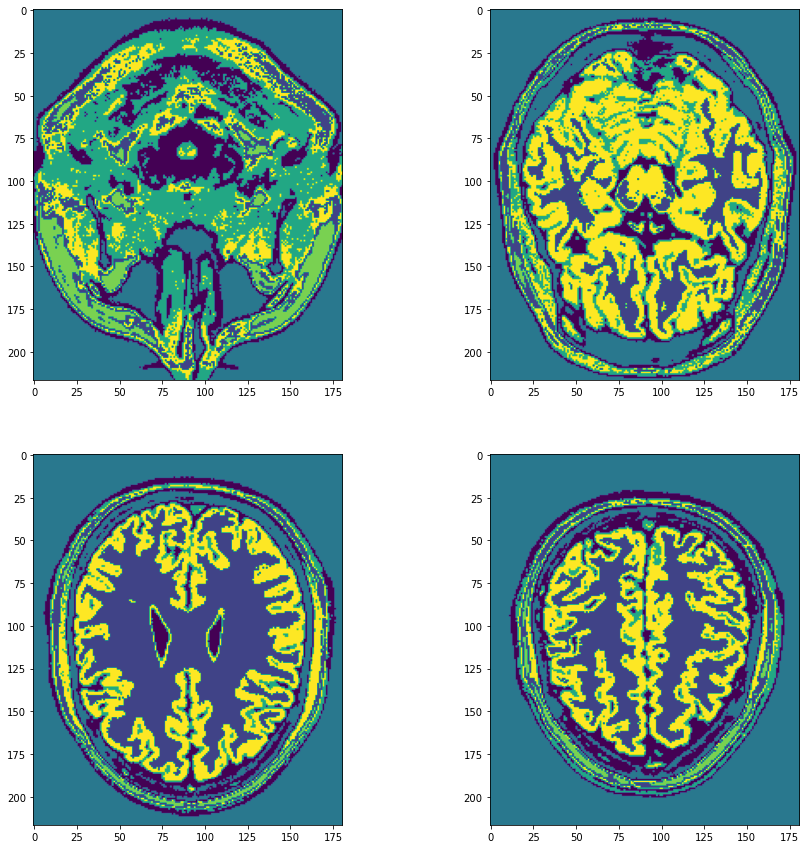

In [9]:
# check the results on examples
f, axarr = plt.subplots(2,2, figsize=(15,15))
axarr[0,0].imshow(clustered[0])
axarr[0,1].imshow(clustered[55])
axarr[1,0].imshow(clustered[100])
axarr[1,1].imshow(clustered[120])
plt.show()


In [12]:
# saves clustered images and create gif
pathlib.Path('data/clustered').mkdir(parents=True, exist_ok=True)
for i in range(clustered.shape[0]):
    plt.imsave(f'data/clustered/{i}.png', clustered[i])

with imageio.get_writer('data/clustered/clust_fin.gif', mode='I') as writer:
    for i in range(clustered.shape[0]):
        image = imageio.imread(f'data/clustered/{i}.png')
        writer.append_data(image)


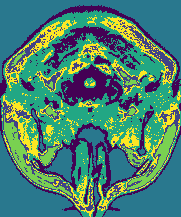

In [13]:
# watch the gif
b64 = base64.b64encode(open('data/clustered/clust_fin.gif','rb').read()).decode('ascii')
display(HTML(f'<img src="data:image/gif;base64,{b64}" />'))